In [1]:
from pyspark.sql import SparkSession
from pyspark import SparkConf, SparkContext
import os
import pandas as pd
import folium
from folium.plugins import HeatMap,MarkerCluster

os.environ['PYSPARK_DRIVER_PYTHON']='jupyter'
os.environ['PYSPARK_PYTHON']='python'


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
spark = SparkSession.builder.master("local[*]").config("spark.driver.memory", "4g").appName("sparkan").getOrCreate()

In [4]:
merged_data = spark.read.format('csv').options(header='true',inferschema='true').load("person_merged_accident.csv")
merged_data.createOrReplaceTempView("merged_data")

In [5]:
allData = spark.read.format('csv').options(header='true',inferschema='true').load("nonull.csv")
allData.createOrReplaceTempView("allData")

In [39]:
population = {'B1' : ["BRONX","BROOKLYN","MANHATTAN","QUEENS","STATEN ISLAND"],
             'POPULATION' : [1385108,2552911,1585873,2250002,468730]} 
population_df = pd.DataFrame(population)

# PEDESTRIAN 


In [9]:
distinct_PED_LOCATION = "SELECT PED_LOCATION,COUNT(*) AS VALS FROM merged_data where  PED_LOCATION is not null"
distinct_PED_LOCATION += "  AND PED_LOCATION NOT IN ('Unknown','Does Not Apply') GROUP BY PED_LOCATION ORDER BY VALS DESC"
distinct_PED_ACTION = "SELECT PED_ACTION,COUNT(*) AS VALS FROM merged_data where PED_ACTION is not null"
distinct_PED_ACTION += " AND PED_ACTION NOT IN ('Unknown','Does Not Apply') GROUP BY PED_ACTION ORDER BY VALS DESC"

In [10]:
distinct_PED_ACTION_df = spark.sql(distinct_PED_ACTION)
distinct_PED_ACTION_df.show()

+--------------------+-----+
|          PED_ACTION| VALS|
+--------------------+-----+
|Crossing With Signal|29416|
|Crossing, No Sign...|13642|
|Crossing, No Sign...| 6727|
|Other Actions in ...| 6160|
|Crossing Against ...| 5612|
|      Not in Roadway| 3717|
|Emerging from in ...| 2603|
|  Working in Roadway| 1210|
|Getting On/Off Ve...| 1109|
|Riding/Walking Al...|  767|
|  Playing in Roadway|  451|
|Riding/Walking Al...|  248|
|Pushing/Working o...|  202|
|Going to/From Sto...|   66|
+--------------------+-----+



In [11]:
distinct_PED_LOCATION_df = spark.sql(distinct_PED_LOCATION)
distinct_PED_LOCATION_df.show()

+--------------------+-----+
|        PED_LOCATION| VALS|
+--------------------+-----+
|Pedestrian/Bicycl...|47918|
|Pedestrian/Bicycl...|26080|
+--------------------+-----+



In [12]:
pd_action = distinct_PED_ACTION_df.toPandas()

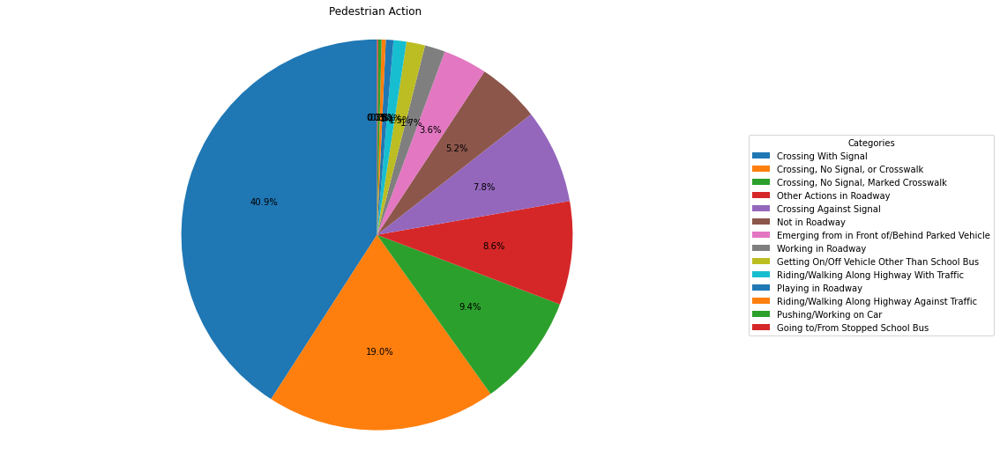

In [14]:
fig, ax = plt.subplots(figsize=(15, 9))  

wedges, texts, autotexts = ax.pie(pd_action['VALS'], labels=None, autopct='%1.1f%%', startangle=90)

ax.legend(wedges, pd_action['PED_ACTION'], title="Categories", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

ax.axis('equal')
ax.set_title('Pedestrian Action')

plt.show()

In [234]:
borough_PED_ACTION = "SELECT PED_ACTION,B1,COUNT(*) AS VALS FROM merged_data where PED_ACTION is not null"
borough_PED_ACTION += " AND PED_ACTION NOT IN ('Unknown','Does Not Apply')"
borough_PED_ACTION += " GROUP BY PED_ACTION,B1 ORDER BY VALS DESC"

In [16]:
borough_PED_ACTION_df = spark.sql(borough_PED_ACTION)
borough_PED_ACTION_df.show()

+--------------------+-------------+----+
|          PED_ACTION|           B1|VALS|
+--------------------+-------------+----+
|Crossing With Signal|     BROOKLYN|9736|
|Crossing With Signal|    MANHATTAN|7170|
|Crossing With Signal|       QUEENS|6038|
|Crossing, No Sign...|     BROOKLYN|4001|
|Crossing With Signal|        BRONX|3514|
|Crossing, No Sign...|       QUEENS|3303|
|Crossing With Signal|STATEN ISLAND|2958|
|Crossing, No Sign...|    MANHATTAN|2587|
|Crossing, No Sign...|        BRONX|2439|
|Crossing, No Sign...|       QUEENS|2173|
|Crossing, No Sign...|     BROOKLYN|1824|
|Crossing Against ...|     BROOKLYN|1823|
|Other Actions in ...|     BROOKLYN|1817|
|Crossing Against ...|    MANHATTAN|1542|
|Other Actions in ...|    MANHATTAN|1536|
|Other Actions in ...|       QUEENS|1315|
|Crossing, No Sign...|STATEN ISLAND|1312|
|Crossing, No Sign...|        BRONX|1147|
|      Not in Roadway|     BROOKLYN|1072|
|      Not in Roadway|       QUEENS|1031|
+--------------------+------------

In [17]:
borough_ped_action = borough_PED_ACTION_df.toPandas()

In [236]:
borough_PED_YEAR = "SELECT YEAR(CAST(TO_DATE(CRASH_DATE,'MM/dd/yyyy') as DATE)) as YEAR_OCCUR,COUNT(*) AS VALS FROM merged_data where PED_ACTION is not null"
borough_PED_YEAR += " AND PED_ACTION  IN ('Crossing With Signal')"
borough_PED_YEAR += " GROUP BY YEAR_OCCUR  ORDER BY YEAR_OCCUR"

In [238]:
borough_PED_YEAR_df = spark.sql(borough_PED_YEAR)
borough_PED_YEAR_df.show()

+----------+----+
|YEAR_OCCUR|VALS|
+----------+----+
|      2012|   1|
|      2013|   3|
|      2014|   2|
|      2015|   2|
|      2016|3173|
|      2017|4426|
|      2018|4698|
|      2019|4454|
|      2020|2678|
|      2021|3145|
|      2022|3748|
|      2023|3086|
+----------+----+



In [243]:
PED_ACTION_CF  = """
SELECT PED_ACTION, CONTRIBUTING_FACTOR_1, COUNT(*) AS VALS FROM merged_data 
where PED_ACTION = 'Crossing With Signal' AND CONTRIBUTING_FACTOR_1 NOT IN ('Unspecified') and CONTRIBUTING_FACTOR_1 is not null
GROUP BY CONTRIBUTING_FACTOR_1,PED_ACTION ORDER BY VALS DESC
"""
PED_ACTION_CF_df = spark.sql(PED_ACTION_CF)
PED_ACTION_CF_df.show()

+--------------------+---------------------+----+
|          PED_ACTION|CONTRIBUTING_FACTOR_1|VALS|
+--------------------+---------------------+----+
|Crossing With Signal| Pedestrian/Bicycl...|1069|
|Crossing With Signal| Driver Inattentio...| 874|
|Crossing With Signal| Failure to Yield ...| 449|
|Crossing With Signal|      Other Vehicular| 407|
|Crossing With Signal|  Alcohol Involvement| 127|
|Crossing With Signal| View Obstructed/L...|  98|
|Crossing With Signal| Cell Phone (hand-...|  95|
|Crossing With Signal| Traffic Control D...|  89|
|Crossing With Signal|    Pavement Slippery|  41|
|Crossing With Signal|     Backing Unsafely|  34|
|Crossing With Signal|         Unsafe Speed|  26|
|Crossing With Signal|  Driver Inexperience|  23|
|Crossing With Signal|   Turning Improperly|  22|
|Crossing With Signal| Passenger Distrac...|  18|
|Crossing With Signal| Passing or Lane U...|  16|
|Crossing With Signal| Listening/Using H...|  15|
|Crossing With Signal|                Glare|  15|


In [248]:
print(PED_ACTION_CF_df.toPandas()['CONTRIBUTING_FACTOR_1'][0])

Pedestrian/Bicyclist/Other Pedestrian Error/Confusion


In [249]:
print(PED_ACTION_CF_df.toPandas()['CONTRIBUTING_FACTOR_1'])

0     Pedestrian/Bicyclist/Other Pedestrian Error/Co...
1                        Driver Inattention/Distraction
2                         Failure to Yield Right-of-Way
3                                       Other Vehicular
4                                   Alcohol Involvement
5                               View Obstructed/Limited
6                                Cell Phone (hand-Held)
7                           Traffic Control Disregarded
8                                     Pavement Slippery
9                                      Backing Unsafely
10                                         Unsafe Speed
11                                  Driver Inexperience
12                                   Turning Improperly
13                                Passenger Distraction
14                       Passing or Lane Usage Improper
15                                Following Too Closely
16                           Listening/Using Headphones
17                                              

In [257]:
PED_ACCIDENT_TIME  = """
SELECT PED_ACTION,hour(CAST(CRASH_TIME AS TIMESTAMP)) as HOUR_OCCUR, COUNT(*) AS VALS FROM merged_data 
where PED_ACTION is not null OR PED_ACTION not in ('Unknown','Does Not Apply')
GROUP BY HOUR_OCCUR,PED_ACTION ORDER BY PED_ACTION,VALS DESC
"""
PED_ACCIDENT_TIME_df = spark.sql(PED_ACCIDENT_TIME)
PED_ACCIDENT_TIME_df.show()
#

+--------------------+----------+----+
|          PED_ACTION|HOUR_OCCUR|VALS|
+--------------------+----------+----+
|Crossing Against ...|        17| 429|
|Crossing Against ...|        18| 413|
|Crossing Against ...|        19| 384|
|Crossing Against ...|        15| 374|
|Crossing Against ...|        16| 358|
|Crossing Against ...|        14| 346|
|Crossing Against ...|        20| 330|
|Crossing Against ...|         8| 301|
|Crossing Against ...|        21| 300|
|Crossing Against ...|        13| 243|
|Crossing Against ...|        22| 234|
|Crossing Against ...|         0| 228|
|Crossing Against ...|        12| 223|
|Crossing Against ...|        11| 203|
|Crossing Against ...|         9| 198|
|Crossing Against ...|        23| 192|
|Crossing Against ...|         7| 182|
|Crossing Against ...|        10| 154|
|Crossing Against ...|         6| 151|
|Crossing Against ...|         1|  93|
+--------------------+----------+----+
only showing top 20 rows



In [258]:
pd_accident_time = PED_ACCIDENT_TIME_df.toPandas()
pd_accident_time.to_csv("accident_time_data.csv")

In [266]:
PED_ACCIDENT_TIME2  = """
SELECT hour(CAST(CRASH_TIME AS TIMESTAMP)) as HOUR_OCCUR, COUNT(*) AS VALS FROM merged_data 
where PED_ACTION is not null
GROUP BY HOUR_OCCUR ORDER BY HOUR_OCCUR DESC
"""
PED_ACCIDENT_TIME2_df = spark.sql(PED_ACCIDENT_TIME2)
PED_ACCIDENT_TIME2_df.show()

+----------+----+
|HOUR_OCCUR|VALS|
+----------+----+
|        23|2059|
|        22|2778|
|        21|3613|
|        20|4562|
|        19|5330|
|        18|6216|
|        17|6473|
|        16|5235|
|        15|5241|
|        14|4832|
|        13|3893|
|        12|3887|
|        11|3478|
|        10|3087|
|         9|3363|
|         8|4278|
|         7|2638|
|         6|1840|
|         5| 874|
|         4| 770|
+----------+----+
only showing top 20 rows



In [267]:
PED_ACCIDENT_TIME2_pd = PED_ACCIDENT_TIME2_df.toPandas()
fig = px.line(PED_ACCIDENT_TIME2_pd, x='HOUR_OCCUR', y='VALS', markers=True, line_shape='linear',
              labels={'VALS': 'Count of Accidents','HOUR_OCCUR':'TIME'}, title='Number of Pedestrian Accidents VS Time of Day')

fig.show()

# PEDESTRIAN ACTION IN VARIOUS BOROUGHS VS COUNT

<Figure size 1152x720 with 0 Axes>

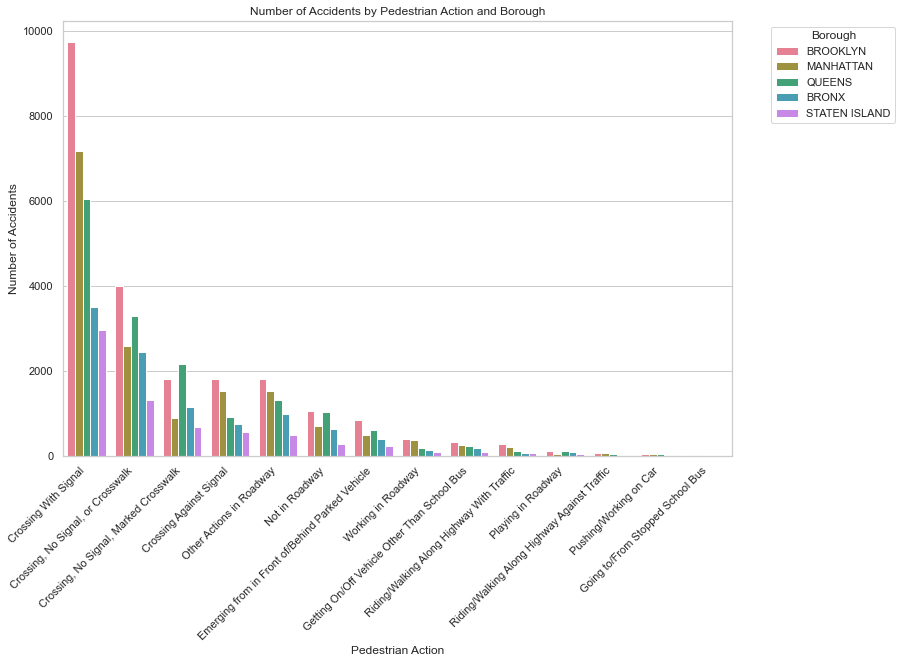

In [18]:
sns.set(style="whitegrid")

plt.figure(figsize=(16, 10))  


custom_palette = sns.color_palette("husl", n_colors=len(borough_ped_action['B1'].unique()))

sns.set(style="whitegrid")
plt.figure(figsize=(12, 8)) 

sns.barplot(x='PED_ACTION', y='VALS', hue='B1', data=borough_ped_action, palette=custom_palette)

plt.xlabel('Pedestrian Action')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents by Pedestrian Action and Borough')

plt.xticks(rotation=45, ha='right')

plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [19]:
getNumOfPedestrianAccidents = "SELECT B1,COUNT(*) As VALS FROM allData WHERE (NUMBER_OF_PEDESTRIANS_INJURED > 0) OR "
getNumOfPedestrianAccidents += " (NUMBER_OF_PEDESTRIANS_KILLED > 0)  group by B1 ORDER BY VALS"

getNumOfPedestrianAccidents_df = spark.sql(getNumOfPedestrianAccidents)

In [20]:
getNumOfPedestrianAccidents_df.show()

+-------------+-----+
|           B1| VALS|
+-------------+-----+
|STATEN ISLAND| 7793|
|        BRONX|15639|
|       QUEENS|23435|
|    MANHATTAN|23993|
|     BROOKLYN|33549|
+-------------+-----+



In [31]:
getNumOfPedestrianAccidents = "SELECT B1,COUNT(*) As VALS FROM allData WHERE (NUMBER_OF_PEDESTRIANS_INJURED > 0) OR "
getNumOfPedestrianAccidents += " (NUMBER_OF_PEDESTRIANS_KILLED > 0) OR VEHICLE_TYPE_CODE_2 like '%pedestrian%' "
getNumOfPedestrianAccidents += " OR VEHICLE_TYPE_CODE_1 like '%pedestrian%' OR VEHICLE_TYPE_CODE_3 like '%pedestrian%' group by B1 ORDER BY VALS"

getNumOfPedestrianAccidents_df = spark.sql(getNumOfPedestrianAccidents)
getNumOfPedestrianAccidents_df.show()

+-------------+-----+
|           B1| VALS|
+-------------+-----+
|STATEN ISLAND| 7793|
|        BRONX|15639|
|       QUEENS|23435|
|    MANHATTAN|23993|
|     BROOKLYN|33549|
+-------------+-----+



In [46]:
getNumOfPedestrianAccidents_Yearly = "SELECT YEAR(CAST(TO_DATE(CRASH_DATE,'MM/dd/yyyy') as DATE)) as YEAR_OCCUR,COUNT(*) As VALS "
getNumOfPedestrianAccidents_Yearly += "FROM allData  WHERE (NUMBER_OF_PEDESTRIANS_INJURED > 0) OR (NUMBER_OF_PEDESTRIANS_KILLED > 0) "
getNumOfPedestrianAccidents_Yearly += " group by YEAR_OCCUR ORDER BY YEAR_OCCUR"

In [47]:
getNumOfPedestrianAccidents_Yearly_DF = spark.sql(getNumOfPedestrianAccidents_Yearly)
getNumOfPedestrianAccidents_Yearly_DF.show()

+----------+-----+
|YEAR_OCCUR| VALS|
+----------+-----+
|      2012| 5221|
|      2013|10467|
|      2014| 9552|
|      2015| 8826|
|      2016|10237|
|      2017|10452|
|      2018|10589|
|      2019|10072|
|      2020| 6357|
|      2021| 7092|
|      2022| 8419|
|      2023| 7125|
+----------+-----+



In [48]:
getNumOfPedestrianAccidents_Yearly_pd = getNumOfPedestrianAccidents_Yearly_DF.toPandas()
fig = px.line(getNumOfPedestrianAccidents_Yearly_pd, x='YEAR_OCCUR', y='VALS', markers=True, line_shape='linear',
              labels={'VALS': 'Count of Accidents','YEAR_OCCUR':'YEAR'}, title='Number of Accidents Per Year')

fig.show()

In [49]:
getNumOfPedestrianAccidents_Year = "SELECT B1,YEAR(CAST(TO_DATE(CRASH_DATE,'MM/dd/yyyy') as DATE)) as YEAR_OCCUR,COUNT(*) As VALS "
getNumOfPedestrianAccidents_Year += "FROM allData  WHERE (NUMBER_OF_PEDESTRIANS_INJURED > 0) OR (NUMBER_OF_PEDESTRIANS_KILLED > 0) "
getNumOfPedestrianAccidents_Year += " group by B1,YEAR_OCCUR ORDER BY B1,YEAR_OCCUR"

getNumOfPedestrianAccidents_Year_DF = spark.sql(getNumOfPedestrianAccidents_Year)
getNumOfPedestrianAccidents_Year_DF.show()

getNumOfPedestrianAccidents_Year_pd = getNumOfPedestrianAccidents_Year_DF.toPandas()

+--------+----------+----+
|      B1|YEAR_OCCUR|VALS|
+--------+----------+----+
|   BRONX|      2012| 727|
|   BRONX|      2013|1622|
|   BRONX|      2014|1438|
|   BRONX|      2015|1334|
|   BRONX|      2016|1425|
|   BRONX|      2017|1456|
|   BRONX|      2018|1580|
|   BRONX|      2019|1512|
|   BRONX|      2020|1072|
|   BRONX|      2021|1178|
|   BRONX|      2022|1282|
|   BRONX|      2023|1013|
|BROOKLYN|      2012|1793|
|BROOKLYN|      2013|3511|
|BROOKLYN|      2014|3238|
|BROOKLYN|      2015|2974|
|BROOKLYN|      2016|3242|
|BROOKLYN|      2017|3171|
|BROOKLYN|      2018|3295|
|BROOKLYN|      2019|3215|
+--------+----------+----+
only showing top 20 rows



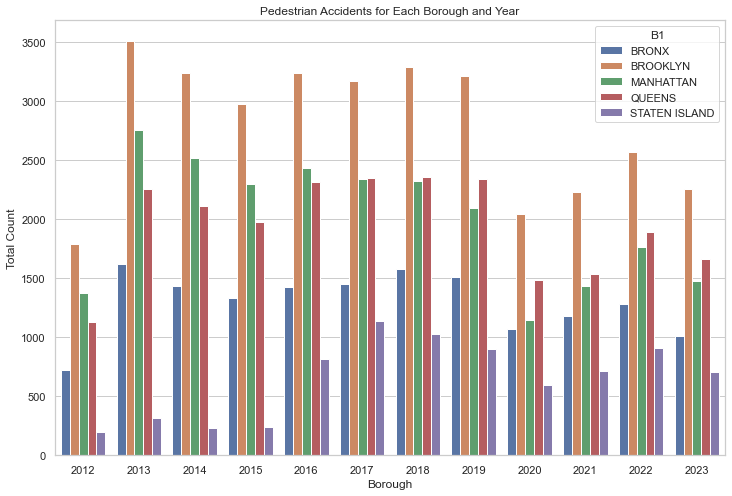

In [50]:
sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
sns.barplot(x='YEAR_OCCUR', y='VALS', hue='B1', data=getNumOfPedestrianAccidents_Year_pd)


plt.title('Pedestrian Accidents for Each Borough and Year')
plt.xlabel('Borough')
plt.ylabel('Total Count')

plt.show()

In [70]:
getCountofPedestrianDeath = " SELECT YEAR(CAST(TO_DATE(CRASH_DATE,'MM/dd/yyyy') as DATE)) as YEAR_OCCUR,"
getCountofPedestrianDeath += " SUM(NUMBER_OF_PEDESTRIANS_KILLED) AS NUM_DEATHS, SUM(NUMBER_OF_PEDESTRIANS_INJURED) AS NUM_INJURED"
getCountofPedestrianDeath += " from allData group by YEAR_OCCUR ORDER BY YEAR_OCCUR"

getCountofPedestrianDeath_df = spark.sql(getCountofPedestrianDeath)
getCountofPedestrianDeath_df.show()

getCountofPedestrianDeath_pd = getCountofPedestrianDeath_df.toPandas()

+----------+----------+-----------+
|YEAR_OCCUR|NUM_DEATHS|NUM_INJURED|
+----------+----------+-----------+
|      2012|        67|       5367|
|      2013|       141|      10811|
|      2014|       115|       9894|
|      2015|       114|       9030|
|      2016|       136|      10551|
|      2017|       123|      10860|
|      2018|       121|      10895|
|      2019|       126|      10339|
|      2020|        96|       6503|
|      2021|       123|       7268|
|      2022|       118|       8668|
|      2023|        76|       7385|
+----------+----------+-----------+



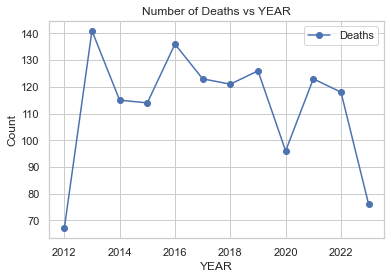

In [58]:
plt.plot(getCountofPedestrianDeath_pd['YEAR_OCCUR'],getCountofPedestrianDeath_pd['NUM_DEATHS'], marker='o', label='Deaths')


plt.xlabel('YEAR')
plt.ylabel('Count')

plt.title('Number of Deaths vs YEAR')

plt.legend()
plt.show()

In [216]:
plt.close()

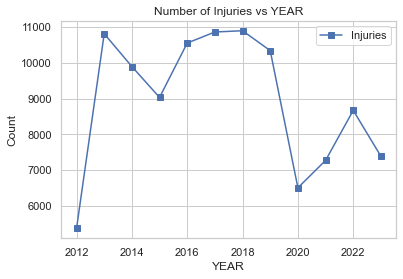

In [217]:
plt.plot(getCountofPedestrianDeath_pd['YEAR_OCCUR'],getCountofPedestrianDeath_pd['NUM_INJURED'], marker='s', label='Injuries')

plt.xlabel('YEAR')
plt.ylabel('Count')

plt.title('Number of Injuries vs YEAR')

plt.legend()
plt.show()

In [218]:
plt.close()

# CYCLIST

In [21]:
# This shows the number of injured or killed Accidents counts involving cyclists
getNumOfCyclistAccidents = "SELECT B1,COUNT(*) As VALS FROM allData WHERE (NUMBER_OF_CYCLIST_INJURED > 0) OR "
getNumOfCyclistAccidents += " (NUMBER_OF_CYCLIST_KILLED > 0)  group by B1 ORDER BY VALS"

getNumOfCyclistAccidents_df = spark.sql(getNumOfCyclistAccidents)
getNumOfCyclistAccidents_df.show()

+-------------+-----+
|           B1| VALS|
+-------------+-----+
|STATEN ISLAND| 4181|
|        BRONX| 4563|
|       QUEENS| 9093|
|    MANHATTAN|13861|
|     BROOKLYN|19283|
+-------------+-----+



In [22]:
# This shows the total number of Accidents counts involving cyclists
getNumOfCyclistAccidents = "SELECT B1,COUNT(*) As VALS FROM allData WHERE (NUMBER_OF_CYCLIST_INJURED > 0) OR "
getNumOfCyclistAccidents += " (NUMBER_OF_CYCLIST_KILLED > 0) OR LOWER(VEHICLE_TYPE_CODE_1) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_2) like '%bike%' "
getNumOfCyclistAccidents += " OR LOWER(VEHICLE_TYPE_CODE_3) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_4) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_5) like '%bike%'"
getNumOfCyclistAccidents += "  group by B1 ORDER BY VALS"
getNumOfCyclistAccidents_df = spark.sql(getNumOfCyclistAccidents)
getNumOfCyclistAccidents_df.show()

+-------------+-----+
|           B1| VALS|
+-------------+-----+
|STATEN ISLAND| 5643|
|        BRONX| 6310|
|       QUEENS|11848|
|    MANHATTAN|18722|
|     BROOKLYN|24814|
+-------------+-----+



In [35]:
pd_numcycle = getNumOfCyclistAccidents_df.toPandas()

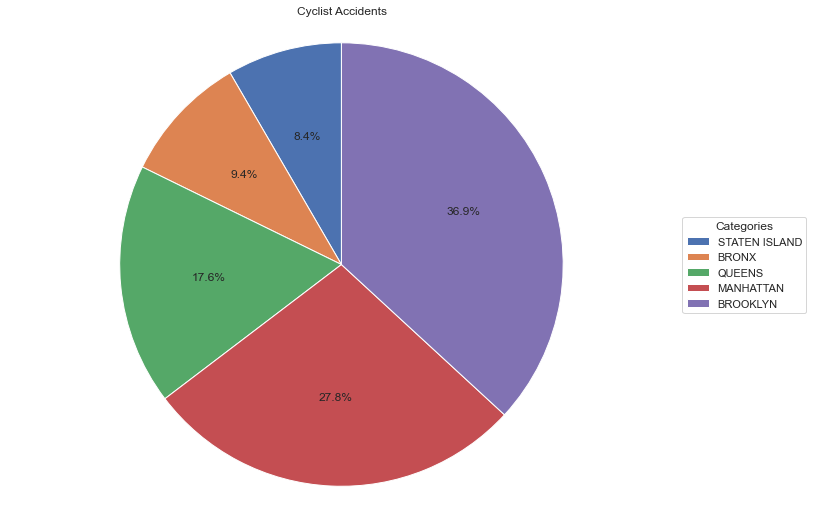

In [36]:
fig, ax = plt.subplots(figsize=(12, 9))  # Adjust width and height as needed


wedges, texts, autotexts = ax.pie(pd_numcycle['VALS'], labels=None, autopct='%1.1f%%', startangle=90)

ax.legend(wedges, pd_numcycle['B1'], title="Categories", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))


ax.axis('equal')


ax.set_title('Cyclist Accidents')

plt.show()

In [41]:
pd_numcycle_pop =  pd.merge(pd_numcycle, population_df, on='B1', how='inner')
pd_numcycle_pop['PER_POPULATION'] = (pd_numcycle_pop['POPULATION']/pd_numcycle_pop['POPULATION'].sum()) * 100

In [42]:
pd_numcycle_pop['PER_ACCIDENT'] = (pd_numcycle_pop['VALS']/pd_numcycle_pop['VALS'].sum()) * 100


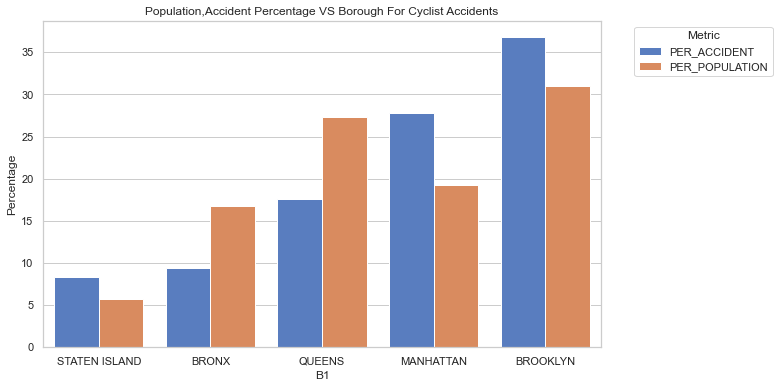

In [44]:
df_melted = pd.melt(pd_numcycle_pop, id_vars='B1', value_vars=['PER_ACCIDENT', 'PER_POPULATION'],
                    var_name='Metric', value_name='Value')

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(x='B1', y='Value', hue='Metric', data=df_melted, palette='muted')

plt.xlabel('B1')
plt.ylabel('Percentage')
plt.title('Population,Accident Percentage VS Borough For Cyclist Accidents')
plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [224]:
getCountofCyclistDeath = " SELECT YEAR(CAST(TO_DATE(CRASH_DATE,'MM/dd/yyyy') as DATE)) as YEAR_OCCUR,"
getCountofCyclistDeath += " SUM(NUMBER_OF_CYCLIST_KILLED) AS NUM_DEATHS, SUM(NUMBER_OF_CYCLIST_INJURED) AS NUM_INJURED"
getCountofCyclistDeath += " from allData group by YEAR_OCCUR ORDER BY YEAR_OCCUR"

getCountofCyclistDeath_df = spark.sql(getCountofCyclistDeath)
getCountofCyclistDeath_df.show()



+----------+----------+-----------+
|YEAR_OCCUR|NUM_DEATHS|NUM_INJURED|
+----------+----------+-----------+
|      2012|         6|       2021|
|      2013|         8|       3725|
|      2014|        16|       3681|
|      2015|        15|       3884|
|      2016|        17|       4687|
|      2017|        26|       4661|
|      2018|        10|       4513|
|      2019|        30|       4782|
|      2020|        27|       5369|
|      2021|        18|       4773|
|      2022|        16|       4815|
|      2023|        25|       4421|
+----------+----------+-----------+



In [225]:
getCountofCyclistDeath_pd = getCountofCyclistDeath_df.toPandas()

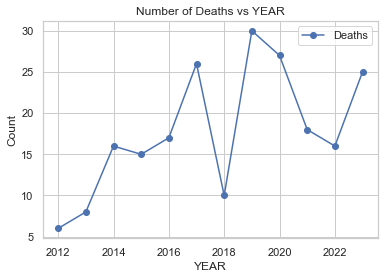

In [226]:

plt.plot(getCountofCyclistDeath_pd['YEAR_OCCUR'],getCountofCyclistDeath_pd['NUM_DEATHS'], marker='o', label='Deaths')


plt.xlabel('YEAR')
plt.ylabel('Count')

plt.title('Number of Deaths vs YEAR')

plt.legend()
plt.show()

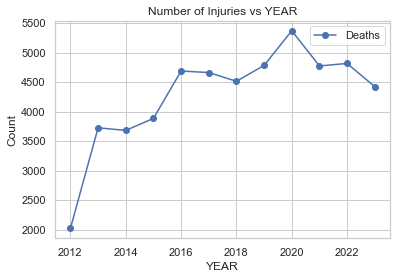

In [227]:
plt.plot(getCountofCyclistDeath_pd['YEAR_OCCUR'],getCountofCyclistDeath_pd['NUM_INJURED'], marker='o', label='Deaths')


plt.xlabel('YEAR')
plt.ylabel('Count')

plt.title('Number of Injuries vs YEAR')

plt.legend()
plt.show()

In [270]:
getNumOfCyclistAccidents_timely = """

SELECT hour(CAST(CRASH_TIME AS TIMESTAMP)) as HOUR_OCCUR, COUNT(*) AS VALS from allData WHERE
(NUMBER_OF_CYCLIST_KILLED > 0) OR LOWER(VEHICLE_TYPE_CODE_1) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_2) like '%bike%'
OR LOWER(VEHICLE_TYPE_CODE_3) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_4) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_5) like '%bike%'
group by HOUR_OCCUR ORDER BY HOUR_OCCUR

"""
getNumOfCyclistAccidents_timely_df = spark.sql(getNumOfCyclistAccidents_timely)
getNumOfCyclistAccidents_timely_df.show()

+----------+----+
|HOUR_OCCUR|VALS|
+----------+----+
|         0|1880|
|         1| 697|
|         2| 453|
|         3| 365|
|         4| 342|
|         5| 373|
|         6| 686|
|         7|1154|
|         8|1894|
|         9|1877|
|        10|1829|
|        11|2202|
|        12|2636|
|        13|2882|
|        14|3307|
|        15|3472|
|        16|3907|
|        17|4437|
|        18|4290|
|        19|3872|
+----------+----+
only showing top 20 rows



In [272]:
getNumOfCyclistAccidents_timely_pd = getNumOfCyclistAccidents_timely_df.toPandas()
fig = px.line(getNumOfCyclistAccidents_timely_pd, x='HOUR_OCCUR', y='VALS', markers=True, line_shape='linear',
              labels={'VALS': 'Count of Accidents','HOUR_OCCUR':'TIME'}, title='Number of Cyclist Accidents VS Time of Day')

fig.show()

In [279]:
cyclist_contributing_factor = """

SELECT CONTRIBUTING_FACTOR_VEHICLE_1, COUNT(*) AS VALS from allData WHERE
(NUMBER_OF_CYCLIST_KILLED > 0) OR LOWER(VEHICLE_TYPE_CODE_1) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_2) like '%bike%'
OR LOWER(VEHICLE_TYPE_CODE_3) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_4) like '%bike%' OR LOWER(VEHICLE_TYPE_CODE_5) like '%bike%'
AND CONTRIBUTING_FACTOR_VEHICLE_1 is not null
group by CONTRIBUTING_FACTOR_VEHICLE_1 ORDER BY VALS DESC

"""
cyclist_contributing_factor_df = spark.sql(cyclist_contributing_factor)
cyclist_contributing_factor_df.show()


+-----------------------------+-----+
|CONTRIBUTING_FACTOR_VEHICLE_1| VALS|
+-----------------------------+-----+
|         Driver Inattentio...|15492|
|                  Unspecified| 9474|
|         Failure to Yield ...| 6550|
|         Pedestrian/Bicycl...| 4704|
|         Traffic Control D...| 2988|
|         Passing or Lane U...| 2349|
|         Following Too Clo...| 1355|
|                 Unsafe Speed| 1155|
|           Turning Improperly| 1142|
|              Other Vehicular|  954|
|          Passing Too Closely|  863|
|          Driver Inexperience|  765|
|         View Obstructed/L...|  732|
|         Passenger Distrac...|  643|
|         Unsafe Lane Changing|  554|
|          Alcohol Involvement|  409|
|         Reaction to Uninv...|  387|
|             Backing Unsafely|  381|
|         Aggressive Drivin...|  292|
|            Pavement Slippery|  178|
+-----------------------------+-----+
only showing top 20 rows



# MOTORIST

In [23]:
getNumOfMotoristAccidents = "SELECT B1,COUNT(*) As VALS FROM allData WHERE (NUMBER_OF_MOTORIST_INJURED > 0) OR "
getNumOfMotoristAccidents += " (NUMBER_OF_MOTORIST_KILLED > 0)  "
getNumOfMotoristAccidents += " group by B1 ORDER BY VALS"

In [34]:
getNumOfMotoristAccidents_df = spark.sql(getNumOfMotoristAccidents)
getNumOfMotoristAccidents_df.show()

+-------------+-----+
|           B1| VALS|
+-------------+-----+
|STATEN ISLAND|31162|
|        BRONX|35562|
|    MANHATTAN|52590|
|       QUEENS|69362|
|     BROOKLYN|72790|
+-------------+-----+



In [37]:
pd_nummotor = getNumOfMotoristAccidents_df.toPandas()

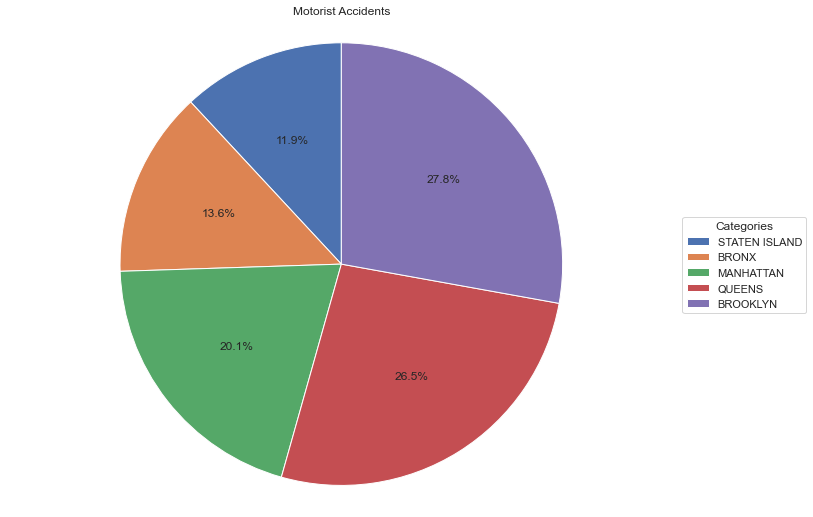

In [38]:
fig, ax = plt.subplots(figsize=(12, 9))  # Adjust width and height as needed


wedges, texts, autotexts = ax.pie(pd_nummotor['VALS'], labels=None, autopct='%1.1f%%', startangle=90)

ax.legend(wedges, pd_nummotor['B1'], title="Categories", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))


ax.axis('equal')


ax.set_title('Motorist Accidents')

plt.show()

In [40]:
pd_nummotor_pop = pd.merge(pd_nummotor, population_df, on='B1', how='inner')
pd_nummotor_pop['PER_POPULATION'] = (pd_nummotor_pop['POPULATION']/pd_nummotor_pop['POPULATION'].sum()) * 100

In [43]:
pd_nummotor_pop['PER_ACCIDENT'] = (pd_nummotor_pop['VALS']/pd_nummotor_pop['VALS'].sum()) * 100

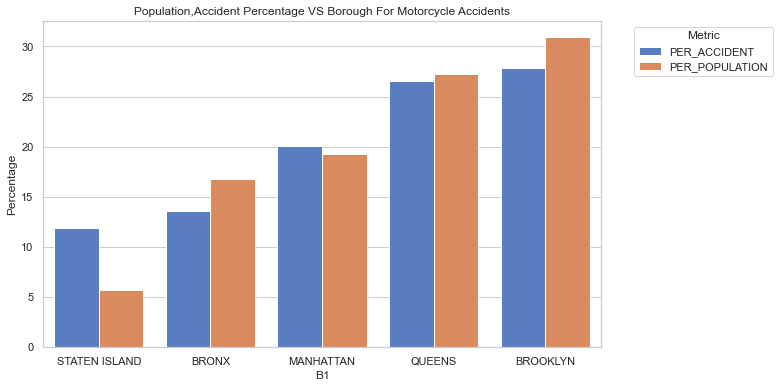

In [45]:
df_melted2 = pd.melt(pd_nummotor_pop, id_vars='B1', value_vars=['PER_ACCIDENT', 'PER_POPULATION'],
                    var_name='Metric', value_name='Value')

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(x='B1', y='Value', hue='Metric', data=df_melted2, palette='muted')
plt.xlabel('B1')
plt.ylabel('Percentage')
plt.title('Population,Accident Percentage VS Borough For Motorcycle Accidents')
plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [51]:
getNumOfMotoristAccidents_Yearly = "SELECT YEAR(CAST(TO_DATE(CRASH_DATE,'MM/dd/yyyy') as DATE)) as YEAR_OCCUR,COUNT(*) As VALS "
getNumOfMotoristAccidents_Yearly += "FROM allData  WHERE (NUMBER_OF_MOTORIST_INJURED > 0) OR (NUMBER_OF_MOTORIST_KILLED > 0) "
getNumOfMotoristAccidents_Yearly += " group by YEAR_OCCUR ORDER BY YEAR_OCCUR"

getNumOfMotoristAccidents_Yearly_DF = spark.sql(getNumOfMotoristAccidents_Yearly)
getNumOfMotoristAccidents_Yearly_DF.show()

+----------+-----+
|YEAR_OCCUR| VALS|
+----------+-----+
|      2012|10299|
|      2013|20545|
|      2014|19051|
|      2015|19788|
|      2016|25195|
|      2017|27291|
|      2018|28220|
|      2019|27726|
|      2020|19747|
|      2021|22715|
|      2022|21325|
|      2023|19564|
+----------+-----+



In [52]:
getNumOfMotoristAccidents_Yearly_pd = getNumOfMotoristAccidents_Yearly_DF.toPandas()
fig = px.line(getNumOfPedestrianAccidents_Yearly_pd, x='YEAR_OCCUR', y='VALS', markers=True, line_shape='linear',
              labels={'VALS': 'Count of Accidents','YEAR_OCCUR':'YEAR'}, title='Number of Accidents Per Year')

fig.show()

In [228]:
getCountofMotoristDeath = " SELECT YEAR(CAST(TO_DATE(CRASH_DATE,'MM/dd/yyyy') as DATE)) as YEAR_OCCUR,"
getCountofMotoristDeath += " SUM(NUMBER_OF_MOTORIST_KILLED) AS NUM_DEATHS, SUM(NUMBER_OF_MOTORIST_INJURED) AS NUM_INJURED"
getCountofMotoristDeath += " from allData group by YEAR_OCCUR ORDER BY YEAR_OCCUR"

getCountofMotoristDeath_df = spark.sql(getCountofMotoristDeath)
getCountofMotoristDeath_df.show()

getCountofMotoristDeath_pd = getCountofMotoristDeath_df.toPandas()

+----------+----------+-----------+
|YEAR_OCCUR|NUM_DEATHS|NUM_INJURED|
+----------+----------+-----------+
|      2012|        49|      16168|
|      2013|        93|      32366|
|      2014|        84|      29712|
|      2015|        72|      30307|
|      2016|        60|      38789|
|      2017|        91|      41423|
|      2018|        91|      42562|
|      2019|        76|      41627|
|      2020|       121|      29522|
|      2021|       117|      33915|
|      2022|        93|      31850|
|      2023|        93|      29562|
+----------+----------+-----------+



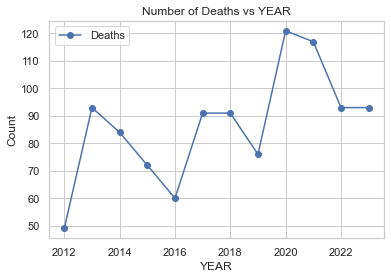

In [229]:
plt.plot(getCountofMotoristDeath_pd['YEAR_OCCUR'],getCountofMotoristDeath_pd['NUM_DEATHS'], marker='o', label='Deaths')


plt.xlabel('YEAR')
plt.ylabel('Count')

plt.title('Number of Deaths vs YEAR')

plt.legend()
plt.show()

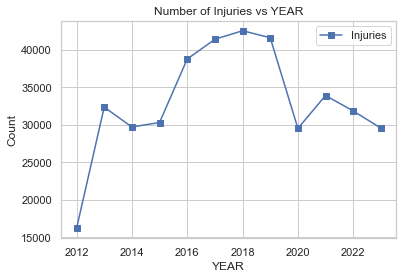

In [232]:
plt.plot(getCountofMotoristDeath_pd['YEAR_OCCUR'],getCountofMotoristDeath_pd['NUM_INJURED'], marker='s', label='Injuries')

plt.xlabel('YEAR')
plt.ylabel('Count')

plt.title('Number of Injuries vs YEAR')

plt.legend()
plt.show()

# Weather Data Correlation

In [148]:
weather_data = spark.read.format('csv').options(header='true',inferschema='true').load("Weather_data.csv")
weather_data.createOrReplaceTempView("weather_data")

In [149]:
weather_data.count

<bound method DataFrame.count of DataFrame[time: string, Amt_PrecipHourly: double, Temperature: double, Visibility: double]>

In [150]:
distinct_dates = "SELECT COUNT(DISTINCT time) from weather_data"

In [151]:
distinct_dates_df = spark.sql(distinct_dates)

In [152]:
distinct_dates_df.show()

+--------------------+
|count(DISTINCT time)|
+--------------------+
|                3014|
+--------------------+



In [199]:
weather_final = """
SELECT 
date_format(TO_DATE(w.time, 'M/d/yyyy'), 'MM/dd/yyyy') AS formatted_date,
w.*
FROM weather_data AS w 
WHERE YEAR(CAST(TO_DATE(w.time,'M/D/yyyy') as DATE)) > 2013
"""

In [200]:
weather_final_df = spark.sql(weather_final)

In [201]:
weather_final_df.show()

+--------------+---------+----------------+------------+-----------+
|formatted_date|     time|Amt_PrecipHourly| Temperature| Visibility|
+--------------+---------+----------------+------------+-----------+
|    01/01/2014| 1/1/2014|             0.0|   -1.515625|   16069.75|
|    01/02/2014| 1/2/2014|             0.0|-1.134210526|15365.05263|
|    01/03/2014| 1/3/2014|     0.619512195|-8.546511628|4990.697674|
|    01/04/2014| 1/4/2014|     0.226923077|      -9.475|   16069.75|
|    01/05/2014| 1/5/2014|     0.133333333|-0.538095238|12491.42857|
|    01/06/2014| 1/6/2014|     0.811627907| 8.071153846|     4950.5|
|    01/07/2014| 1/7/2014|     0.596551724|   -9.234375|   16069.75|
|    01/08/2014| 1/8/2014|             0.0|  -10.021875|   16069.75|
|    01/09/2014| 1/9/2014|             0.0|      -3.225|   16069.75|
|    01/10/2014|1/10/2014|     0.191891892| 0.055813953| 10886.7907|
|    01/11/2014|1/11/2014|     1.003508772| 8.091666667|2624.683333|
|    01/12/2014|1/12/2014|     1.1

In [202]:
weather_final_df.createOrReplaceTempView("final_weather_data")

In [203]:
weather_accident_merged_sql = """
SELECT ad.*,fw.* from allData ad inner join final_weather_data fw on fw.formatted_date  = ad.CRASH_DATE
"""

In [204]:
weather_accident_merged_df = spark.sql(weather_accident_merged_sql)


In [205]:
weather_accident_merged_df.show()

+----------+----------+-------+--------+---------+----------+--------------------+------------------+---------------+-------------------------+------------------------+-----------------------------+----------------------------+-------------------------+------------------------+--------------------------+-------------------------+-----------------------------+-----------------------------+-----------------------------+-----------------------------+-----------------------------+------------+--------------------+--------------------+-------------------+-------------------+-------------------+-------------+--------------+---------+----------------+-----------+-----------+
|CRASH_DATE|CRASH_TIME|BOROUGH|ZIP_CODE| LATITUDE| LONGITUDE|      ON_STREET_NAME| CROSS_STREET_NAME|OFF_STREET_NAME|NUMBER_OF_PERSONS_INJURED|NUMBER_OF_PERSONS_KILLED|NUMBER_OF_PEDESTRIANS_INJURED|NUMBER_OF_PEDESTRIANS_KILLED|NUMBER_OF_CYCLIST_INJURED|NUMBER_OF_CYCLIST_KILLED|NUMBER_OF_MOTORIST_INJURED|NUMBER_OF_MOTORIST

In [206]:
weather_accident_merged_df.count()

77012

In [207]:
weather_accident_merged_df.createOrReplaceTempView("groupedData")

In [208]:
grouped_data_sql = """
SELECT COUNT(*) as accident_count,crash_date, Amt_PrecipHourly, Temperature,Visibility

from groupedData group by crash_date,Amt_PrecipHourly, Temperature,Visibility
"""

grouped_data = spark.sql(grouped_data_sql)
grouped_data.show()

+--------------+----------+----------------+------------+-----------+
|accident_count|crash_date|Amt_PrecipHourly| Temperature| Visibility|
+--------------+----------+----------------+------------+-----------+
|           321|01/04/2015|     2.120512821| 8.620833333|7553.041667|
|           164|01/27/2015|     0.526190476|-4.124489796|4256.836735|
|           352|01/04/2014|     0.226923077|      -9.475|   16069.75|
|           787|01/18/2015|     2.329268293|       3.602|    9966.54|
|           389|01/11/2014|     1.003508772| 8.091666667|2624.683333|
|           596|01/11/2017|     0.575862069|        7.35|15207.36111|
|           422|01/05/2015|     1.339393939|  6.82972973|15485.75676|
|           645|01/06/2015|      0.17027027|-5.690697674|10237.18605|
|           433|01/28/2014|             0.0|   -6.696875|   16069.75|
|           382|01/26/2014|     0.064516129|-5.231428571|15061.54286|
|           567|01/19/2018|             0.0|   -1.159375|   16069.75|
|           628|01/1

In [209]:
grouped_data.count()

155

In [210]:
grouped_pandas = grouped_data.toPandas()

In [211]:
grouped_pandas = grouped_pandas.drop('crash_date',axis = 1)
#df.drop('B', axis=1)

In [212]:
grouped_pandas.corr()

,accident_count,Amt_PrecipHourly,Temperature,Visibility
accident_count,1.000000,-0.056305,-0.036332,0.056362
Amt_PrecipHourly,-0.056305,1.000000,0.281200,-0.441086
Temperature,-0.036332,0.281200,1.000000,-0.198589
Visibility,0.056362,-0.441086,-0.198589,1.000000


# Accident Hotspot Analysis

In [286]:
lat_long_sql = "SELECT LATITUDE,LONGITUDE FROM allData where LATITUDE IS NOT NULL and LONGITUDE IS NOT NULL"

lat_long = spark.sql(lat_long_sql).toPandas()

In [2]:
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

In [305]:
lat_long_sql2 = """
SELECT LATITUDE,LONGITUDE,COUNT(*) AS VALS FROM allData where  LATITUDE IS NOT NULL and LONGITUDE IS NOT NULL
AND LATITUDE !=0 AND LONGITUDE !=0 GROUP BY LATITUDE,LONGITUDE HAVING COUNT(*) > 100 ORDER BY VALS DESC
"""
lat_long2 = spark.sql(lat_long_sql2)

In [306]:
lat_long2.count()

1752

In [297]:
lat_long2.show()

+----------+-----------+----+
|  LATITUDE|  LONGITUDE|VALS|
+----------+-----------+----+
| 40.861862|  -73.91282| 685|
| 40.696033|  -73.98453| 646|
|   40.8047|  -73.91243| 597|
|40.6960346|-73.9845292| 587|
| 40.675735|  -73.89686| 546|
| 40.658577|  -73.89063| 500|
|40.7606005|-73.9643142| 474|
| 40.820305|  -73.89083| 467|
|40.7572323|-73.9897922| 456|
|  40.77077|  -73.91727| 456|
|40.6757357|-73.8968533| 435|
|  40.83801|  -73.87329| 433|
| 40.826275|  -73.85971| 419|
|40.6585778|-73.8906229| 418|
| 40.733536|  -73.87035| 415|
|  40.75898|  -73.99595| 414|
|   40.7606|  -73.96434| 408|
| 40.816864| -73.882744| 407|
|  40.69168| -73.999344| 406|
| 40.704494|  -73.81743| 398|
+----------+-----------+----+
only showing top 20 rows



In [311]:
data = lat_long2.toPandas()

def get_color(count, max_count):
    color_step = max_count / 100  
    color_index = int(count / color_step)
    color_index = min(color_index, 99)
    return f'#{color_index:02X}0000'  

max_count = data["VALS"].max()

m = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

for _, entry in data.iterrows():
    color = get_color(entry["VALS"], max_count)
    folium.Marker(
        location=[entry["LATITUDE"], entry["LONGITUDE"]],
        popup=f"Accidents: {entry['VALS']}",
        icon=folium.Icon(color=color),
    ).add_to(marker_cluster)

m


<ipython-input-311-3a42892251da>:25: UserWarning:

color argument of Icon should be one of: {'lightgreen', 'blue', 'white', 'red', 'beige', 'gray', 'darkgreen', 'darkblue', 'pink', 'cadetblue', 'darkpurple', 'orange', 'green', 'lightred', 'black', 'lightblue', 'lightgray', 'darkred', 'purple'}.



In [315]:
data = lat_long2.toPandas()



max_count = data["VALS"].max()

m = folium.Map(location=[40.7128, -74.0060], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
for _, entry in data.iterrows():
    color = get_color(entry["VALS"], max_count)
    folium.Marker(
        location=[entry["LATITUDE"], entry["LONGITUDE"]],
        popup=f"Accidents: {entry['VALS']}",
        icon=folium.Icon(color=color),
    ).add_to(marker_cluster)


heat_data = [[entry["LATITUDE"], entry["LONGITUDE"], entry["VALS"]] for _, entry in data.iterrows()]
HeatMap(heat_data).add_to(m)
m

<ipython-input-315-2b24228961dc>:25: UserWarning:

color argument of Icon should be one of: {'lightgreen', 'blue', 'white', 'red', 'beige', 'gray', 'darkgreen', 'darkblue', 'pink', 'cadetblue', 'darkpurple', 'orange', 'green', 'lightred', 'black', 'lightblue', 'lightgray', 'darkred', 'purple'}.

